#Assignment 3c Auto detection
Building an “auto” detector using YOLO5 based methods<br>
IMT2019014 Ayush das<br>
IMT2019016 Balkaran Singh<br>
IMT2019082 Shivyansh Garg

# Steps to Implement: YOLOv5
We will use PyTorch to implement an object detector based on YOLO v5, one of the faster object detection algorithms.
YOLO stands for You Only Look Once. It's an object detector that uses features learned by a deep convolutional neural network to detect an object.


* Gather a dataset of images(in this case we have the auto folder) and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate YOLOv5 model's performance
* Run test inference to view our model at work



#Installing Requirements and Libraries

In [17]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12316, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 12316 (delta 0), reused 2 (delta 0), pack-reused 12313
Receiving objects: 100% (12316/12316), 11.48 MiB | 13.20 MiB/s, done.
Resolving deltas: 100% (8565/8565), done.
/content/yolov5/yolov5
Setup complete. Using torch 1.10.0+cu111 (Tesla K80)


# Upload Annotated data Using Roboflow

We need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

Here We use the auto images provided as dataset. We upload the images to roboflow ,annotate them and then split it into test/train/valid. And then import the dataset (annotated ) here using api key.


In [18]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [19]:

os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [20]:


from roboflow import Roboflow
rf = Roboflow(api_key="YxLHkIG7zRWCMd3Gfgip")
project = rf.workspace("ayush-das").project("imt2019014auto")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/imt2019014auto-1 in yolov5pytorch:: 100%|██████████| 722/722 [00:00<00:00, 807.52it/s]


#  Train  YOLOv5 model
Parameters --->
- **img:** Input image size
- **batch:**  batch size
- **epochs:** d number of training epochs. 
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. 
- **cache:** cache images for faster training

In [21]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/imt2019014auto-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-76-gc94736a torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degr

# Performance metrics using Tensorboard.


In [22]:
!kill 506

/bin/bash: line 0: kill: (506) - No such process


In [23]:

# %load_ext tensorboard
%reload_ext tensorboard

%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Inference  
Run inference with Trained Weights.

In [24]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/imt2019014auto-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-76-gc94736a torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /content/datasets/imt2019014auto-1/test/images/Datacluster-Auto--102-_jpg.rf.2a344acaa425028c4e605e1931399a88.jpg: 416x416 1 0, Done. (0.026s)
image 2/36 /content/datasets/imt2019014auto-1/test/images/Datacluster-Auto--102-_jpg.rf.4db5512f65edc96d6bca60a0d77cf10f.jpg: 416x416 1 0, Done. (0.026s)
image 3/36 /content/datasets/imt2019014a

#Auto Detection:Test Images

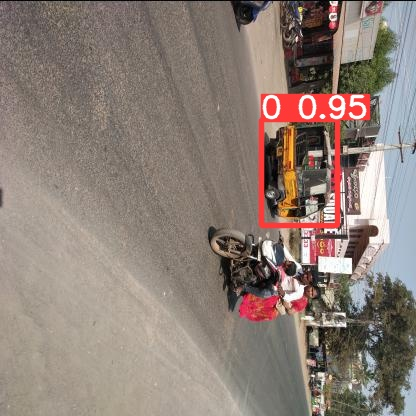

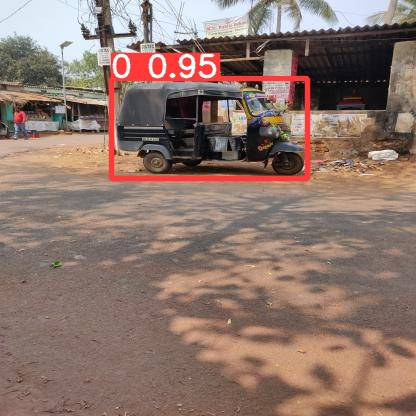

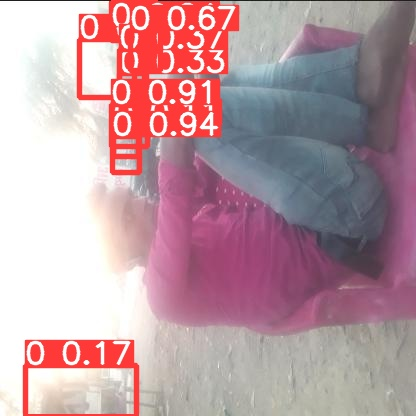

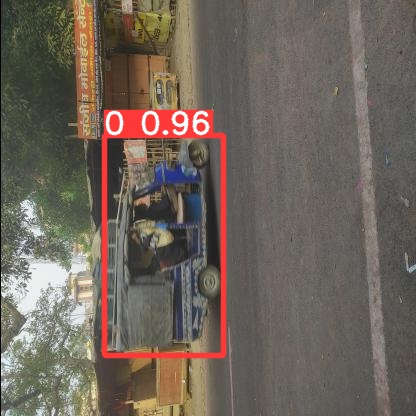

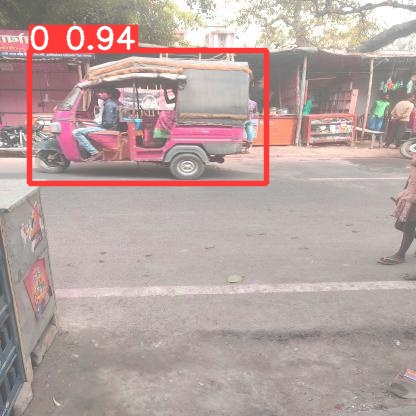

...

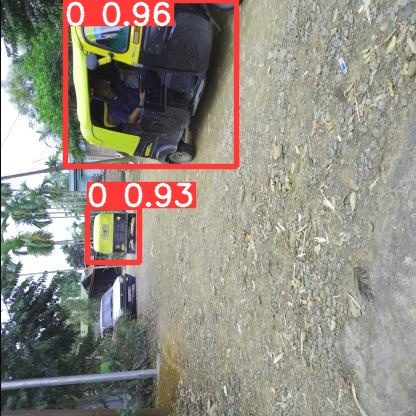

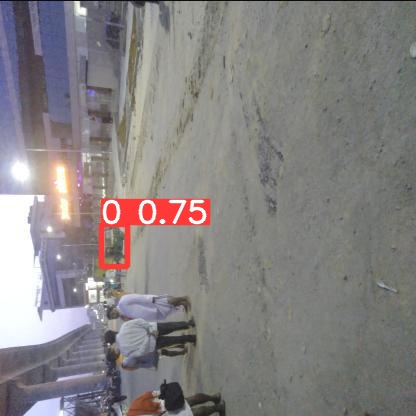

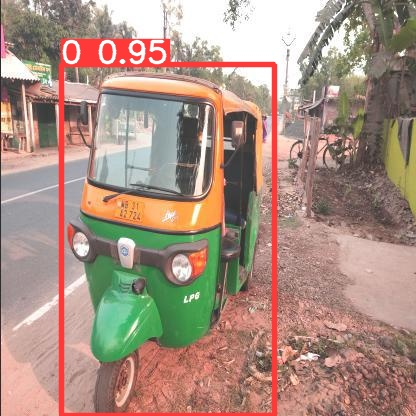

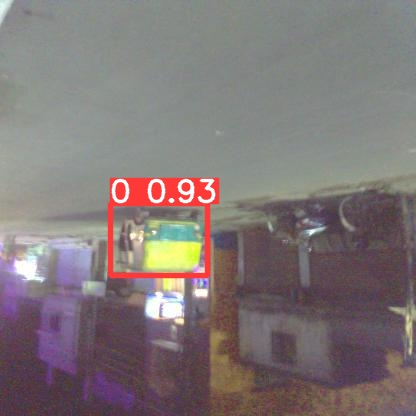

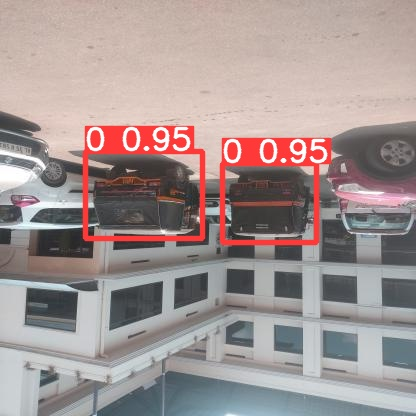

In [25]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")